# EDA

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import scipy.stats as ss
from scipy.stats import f_oneway, norm
from collections import Counter
import math
from itertools import product

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score, RepeatedStratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, f1_score, roc_auc_score, confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score, ConfusionMatrixDisplay, recall_score, precision_score

from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from category_encoders.ordinal import OrdinalEncoder
from category_encoders.one_hot import OneHotEncoder

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
import statsmodels.api as sm
# from pycaret.classification import *

from keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD
import tensorflow as tf

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

TypeError: Unable to convert function return value to a Python type! The signature was
	() -> handle

In [31]:
df = pd.read_csv('fraud_oracle.csv')
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


In [32]:
df.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15420 entries, 0 to 15419
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Month                 15420 non-null  object
 1   WeekOfMonth           15420 non-null  int64 
 2   DayOfWeek             15420 non-null  object
 3   Make                  15420 non-null  object
 4   AccidentArea          15420 non-null  object
 5   DayOfWeekClaimed      15420 non-null  object
 6   MonthClaimed          15420 non-null  object
 7   WeekOfMonthClaimed    15420 non-null  int64 
 8   Sex                   15420 non-null  object
 9   MaritalStatus         15420 non-null  object
 10  Age                   15420 non-null  int64 
 11  Fault                 15420 non-null  object
 12  PolicyType            15420 non-null  object
 13  VehicleCategory       15420 non-null  object
 14  VehiclePrice          15420 non-null  object
 15  FraudFound_P          15420 non-null

In [34]:
df.isnull().sum()

Month                   0
WeekOfMonth             0
DayOfWeek               0
Make                    0
AccidentArea            0
DayOfWeekClaimed        0
MonthClaimed            0
WeekOfMonthClaimed      0
Sex                     0
MaritalStatus           0
Age                     0
Fault                   0
PolicyType              0
VehicleCategory         0
VehiclePrice            0
FraudFound_P            0
PolicyNumber            0
RepNumber               0
Deductible              0
DriverRating            0
Days_Policy_Accident    0
Days_Policy_Claim       0
PastNumberOfClaims      0
AgeOfVehicle            0
AgeOfPolicyHolder       0
PoliceReportFiled       0
WitnessPresent          0
AgentType               0
NumberOfSuppliments     0
AddressChange_Claim     0
NumberOfCars            0
Year                    0
BasePolicy              0
dtype: int64

In [35]:
for column in df:
    if column == 'PolicyNumber':
        pass
    else:
        print(column)
        print(sorted(df[column].unique()),"\n")
    

Month
['Apr', 'Aug', 'Dec', 'Feb', 'Jan', 'Jul', 'Jun', 'Mar', 'May', 'Nov', 'Oct', 'Sep'] 

WeekOfMonth
[1, 2, 3, 4, 5] 

DayOfWeek
['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday'] 

Make
['Accura', 'BMW', 'Chevrolet', 'Dodge', 'Ferrari', 'Ford', 'Honda', 'Jaguar', 'Lexus', 'Mazda', 'Mecedes', 'Mercury', 'Nisson', 'Pontiac', 'Porche', 'Saab', 'Saturn', 'Toyota', 'VW'] 

AccidentArea
['Rural', 'Urban'] 

DayOfWeekClaimed
['0', 'Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday'] 

MonthClaimed
['0', 'Apr', 'Aug', 'Dec', 'Feb', 'Jan', 'Jul', 'Jun', 'Mar', 'May', 'Nov', 'Oct', 'Sep'] 

WeekOfMonthClaimed
[1, 2, 3, 4, 5] 

Sex
['Female', 'Male'] 

MaritalStatus
['Divorced', 'Married', 'Single', 'Widow'] 

Age
[0, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 7

# Issues
### DayOfWeekClaimed, MonthClaimed, and Age contains 0
### PolicyType is a merge of VehicleCategory and BasePolicy
### PolicyNumber is just a row number (similar to customer id)

In [36]:
df[df['DayOfWeekClaimed']=='0']

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
1516,Jul,2,Monday,Honda,Rural,0,0,1,Male,Single,...,new,16 to 17,No,No,External,none,no change,1 vehicle,1994,All Perils


In [37]:
df[df['MonthClaimed']=='0']

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
1516,Jul,2,Monday,Honda,Rural,0,0,1,Male,Single,...,new,16 to 17,No,No,External,none,no change,1 vehicle,1994,All Perils


In [38]:
print(df[df['Age']==0].shape)
df[df['Age']==0].sample(3)

(320, 33)


,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
14938,Jul,4,Friday,Honda,Rural,Tuesday,Aug,1,Male,Single,...,new,16 to 17,No,No,External,none,no change,1 vehicle,1996,Liability
14653,Apr,2,Thursday,Honda,Urban,Friday,Apr,2,Male,Single,...,new,16 to 17,No,No,External,none,no change,1 vehicle,1996,Liability
1203,Feb,2,Saturday,Honda,Urban,Tuesday,Feb,3,Male,Single,...,new,16 to 17,No,No,External,none,no change,1 vehicle,1994,Liability


In [39]:
# Drop the PolicyNumber column
df = df.drop(columns='PolicyNumber')

In [40]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


# Cleansing


In [41]:
# Drop the DayOfWeekClaimed & MonthClaimed == 0, they are on 
#the same row and only in one row.
df = df[~(df['MonthClaimed']=='0')]


In [42]:
df[df['Age']==0]['AgeOfPolicyHolder'].unique()

df['Age'] = df['Age'].replace({0:16.5})

C:\Users\ilias\AppData\Local\Temp\ipykernel_9084\2104975438.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age'] = df['Age'].replace({0:16.5})


In [43]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


# Further Analysis & Feature Plots


C:\Users\ilias\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


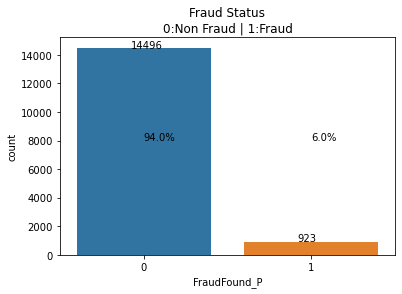

In [44]:
ax = sns.countplot(df['FraudFound_P'], 
                   order = df["FraudFound_P"].value_counts().index)

for p, label in zip(ax.patches, df["FraudFound_P"].value_counts().values):
    ax.annotate(label, (p.get_x()+0.320, p.get_height()))
    
ax.set_title('Fraud Status\n0:Non Fraud | 1:Fraud')
ax.text(0, 8000, f'{round(14496/len(df),2)*100}%')
ax.text(1, 8000, f'{round(923/len(df),2)*100}%')
plt.show()

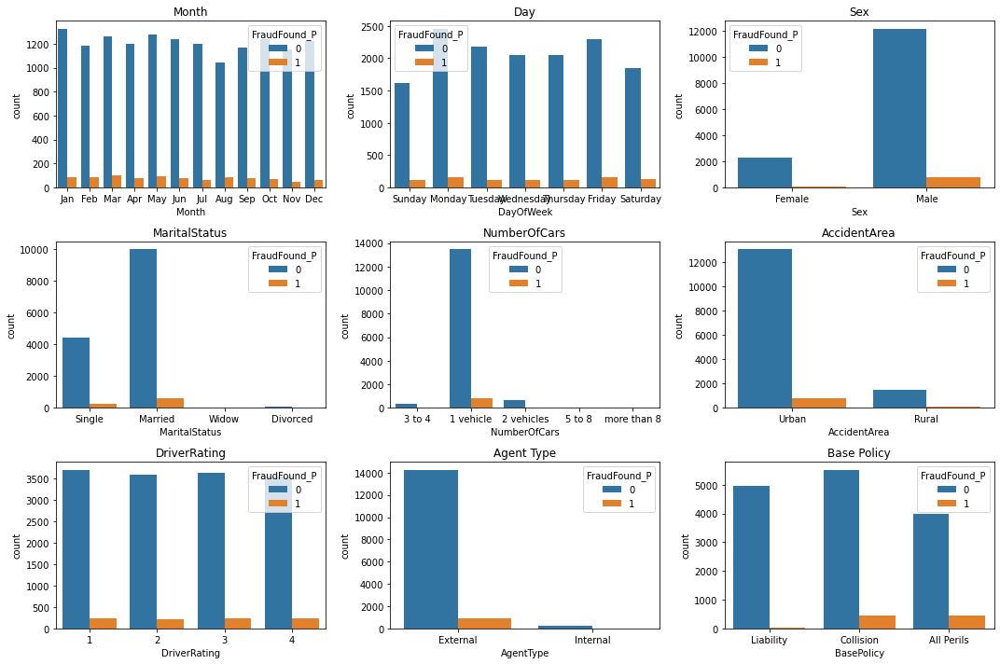

In [45]:
# Subplots for 'Month', 'DayOfWeek', 'Sex', 'MaritalStatus', 'NumberOfCars',
# 'AccidentArea', 'DriverRating', 'AgentType', 'BasePolicy'.


fig, ax = plt.subplots(3,3, figsize=(15,10))
sns.countplot(data=df, x='Month', hue='FraudFound_P', order=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'], ax=ax[0][0])
ax[0][0].set_title('Month')

sns.countplot(data=df, x='DayOfWeek', hue='FraudFound_P', order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'], ax=ax[0][1])
ax[0][1].set_title('Day')

sns.countplot(data=df, x='Sex', hue='FraudFound_P', ax=ax[0][2])
ax[0][2].set_title('Sex')

sns.countplot(data=df, x='MaritalStatus', hue='FraudFound_P', ax=ax[1][0])
ax[1][0].set_title('MaritalStatus')

sns.countplot(data=df, x='NumberOfCars', hue='FraudFound_P', ax=ax[1][1])
ax[1][1].set_title('NumberOfCars')

sns.countplot(data=df, x='AccidentArea', hue='FraudFound_P', ax=ax[1][2])
ax[1][2].set_title('AccidentArea')

sns.countplot(data=df, x='DriverRating', hue='FraudFound_P', ax=ax[2][0])
ax[2][0].set_title('DriverRating')

sns.countplot(data=df, x='AgentType', hue='FraudFound_P', ax=ax[2][1])
ax[2][1].set_title('Agent Type')

sns.countplot(data=df, x='BasePolicy', hue='FraudFound_P', ax=ax[2][2])
ax[2][2].set_title('Base Policy')

plt.tight_layout()


,PolicyType,FraudFound_P,Total Accidents,Percentage by PolicyType,Percentage by Total
0,Sedan - All Perils,411,4086,10.059,2.666
1,Sedan - Collision,384,5584,6.877,2.49
2,Sedan - Liability,36,4987,0.722,0.233
3,Sport - All Perils,0,22,0.0,0.0
4,Sport - Collision,48,348,13.793,0.311
5,Sport - Liability,0,1,0.0,0.0
6,Utility - All Perils,41,340,12.059,0.266
7,Utility - Collision,3,30,10.0,0.019
8,Utility - Liability,0,21,0.0,0.0
9,Column total,923,15419,53.51,5.985


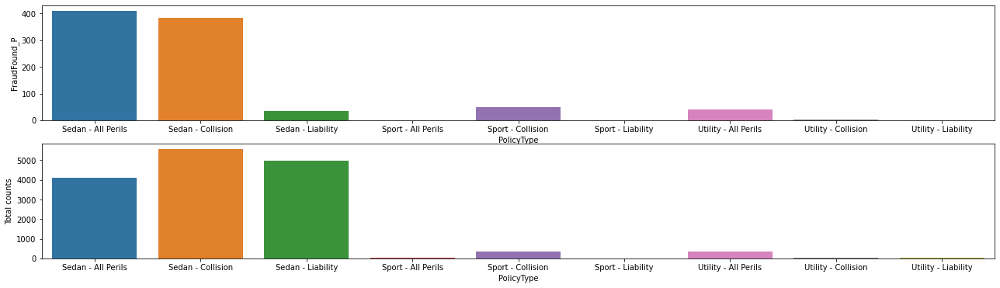

In [46]:
# plot by FraudFound, looking for any obvious signs of correlation wrt fraud
gpd_val1 = df.groupby('PolicyType').agg({'FraudFound_P' : 'sum'}).reset_index()
gpd_val2 = df.groupby('PolicyType').agg('count').reset_index()

fig, (ax1,ax2) = plt.subplots(2,1,figsize=(22,6))
sns.barplot(x='PolicyType', y='FraudFound_P', data= gpd_val1, ax=ax1)
sns.barplot(x='PolicyType', y='FraudFound_P', data= gpd_val2, ax=ax2)

ax2.set(ylabel='Total counts')


total_list = pd.concat([gpd_val1, gpd_val2['FraudFound_P'].rename('Total Accidents')], axis=1)
total_list['Percentage by PolicyType']= round((total_list['FraudFound_P']/total_list['Total Accidents'])*100,3)
total_list['Percentage by Total'] = round((total_list['FraudFound_P']/sum(total_list['Total Accidents']))*100,3)

ax2.set(ylabel='Total counts')

data = [['Column total'],
        [sum(total_list['FraudFound_P'])],
       [sum(total_list['Total Accidents'])],
       [sum(total_list['Percentage by PolicyType'])],
       [sum(total_list['Percentage by Total'])]]

nr = pd.DataFrame(data)

nr1 = nr.transpose()
nr1.rename(columns={0:'PolicyType',1:'FraudFound_P',2:'Total Accidents',3:'Percentage by PolicyType', 4:'Percentage by Total'}, inplace=True)
pd.concat([total_list,nr1], ignore_index=True)

,VehicleCategory,FraudFound_P,Total Accidents,Percentage by VehicleCategory,Percentage by Total
0,Sedan,795,9670,8.221,5.156
1,Sport,84,5358,1.568,0.545
2,Utility,44,391,11.253,0.285
3,Column total,923,15419,21.042,5.986


,BasePolicy,FraudFound_P,Total Accidents,Percentage by BasePolicy,Percentage by Total
0,All Perils,452,4448,10.162,2.931
1,Collision,435,5962,7.296,2.821
2,Liability,36,5009,0.719,0.233
3,Column total,923,15419,18.177,5.985


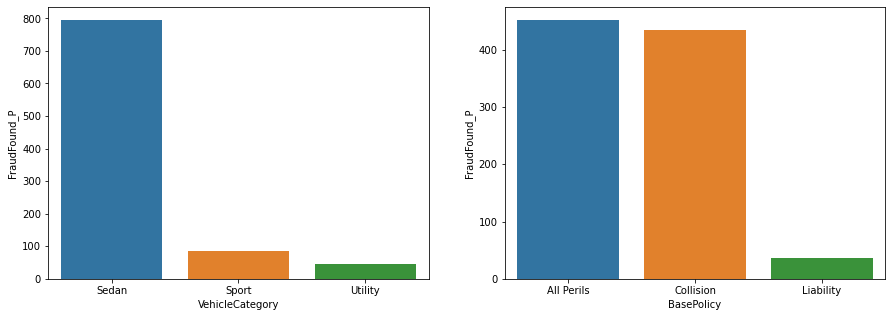

In [47]:
gpd_val1 = df.groupby('VehicleCategory').agg({'FraudFound_P' : 'sum'}).reset_index()
gpd_val6 = df.groupby('VehicleCategory').agg('count').reset_index()
gpd_val3=df.groupby('BasePolicy').agg({'FraudFound_P':'sum'}).reset_index()
gpd_val7 = df.groupby('BasePolicy').agg('count').reset_index()

fig, (ax1, ax3) = plt.subplots(1,2,figsize = (15, 5))
sns.barplot(x='VehicleCategory', y='FraudFound_P', data= gpd_val1, ax=ax1)
#sns.barplot(x='VehicleCategory', y='FraudFound_P', data = gpd_val2, ax=ax2)
sns.barplot(x='BasePolicy', y='FraudFound_P', data = gpd_val3, ax=ax3)
#sns.barplot(x='Basepolicy', y='FraudFound_P', data=gpd_val4, ax=ax4)
None


total_list1 = pd.concat([gpd_val1, gpd_val6['FraudFound_P'].rename('Total Accidents')],axis=1)
total_list1['Percentage by VehicleCategory']= round((total_list1['FraudFound_P']/total_list1['Total Accidents'])*100,3)
total_list1['Percentage by Total'] = round((total_list1['FraudFound_P']/sum(total_list1['Total Accidents']))*100,3)

total_list2 = pd.concat([gpd_val3, gpd_val7['FraudFound_P'].rename('Total Accidents')], axis = 1)
total_list2['Percentage by BasePolicy'] = round((total_list2['FraudFound_P'] / total_list2['Total Accidents'])*100,3)
total_list2['Percentage by Total'] = round((total_list2['FraudFound_P']/sum(total_list2['Total Accidents']))*100,3)

data1 = [['Column total'],
        [sum(total_list1['FraudFound_P'])],
         [sum(total_list1['Total Accidents'])],
         [sum(total_list1['Percentage by VehicleCategory'])],
         [sum(total_list1['Percentage by Total'])]]

data2 = [['Column total'],
         [sum(total_list2['FraudFound_P'])],
         [sum(total_list2['Total Accidents'])],
         [sum(total_list2['Percentage by BasePolicy'])],
         [sum(total_list2['Percentage by Total'])]]

nr1 =pd.DataFrame(data1)
nr1 = nr1.transpose()
nr1.rename(columns={0:'VehicleCategory',1:'FraudFound_P',2:'Total Accidents',3:'Percentage by VehicleCategory', 4:'Percentage by Total'}, inplace=True)
tl1=pd.concat([total_list1,nr1],ignore_index=True)

nr2 = pd.DataFrame(data2)
nr2 = nr2.transpose()
nr2.rename(columns={0:'BasePolicy', 1:'FraudFound_P', 2:'Total Accidents', 3:'Percentage by BasePolicy',4:'Percentage by Total'}, inplace=True)
tl2 = pd.concat([total_list2,nr2],ignore_index=True)


#print(tabulate(tl1, headers=tl1.columns))
#print('  ')
#print(tabulate(tl2, headers=tl2.columns))
display(tl1)
display(tl2)

,Make,FraudFound_P,Total Accidents,Percentage by Make,Percentage by Total
0,Accura,59,472,12.5,0.383
1,BMW,1,15,6.667,0.006
2,Chevrolet,94,1681,5.592,0.61
3,Dodge,2,109,1.835,0.013
4,Ferrari,0,2,0.0,0.0
5,Ford,33,450,7.333,0.214
6,Honda,179,2800,6.393,1.161
7,Jaguar,0,6,0.0,0.0
8,Lexus,0,1,0.0,0.0
9,Mazda,123,2354,5.225,0.798


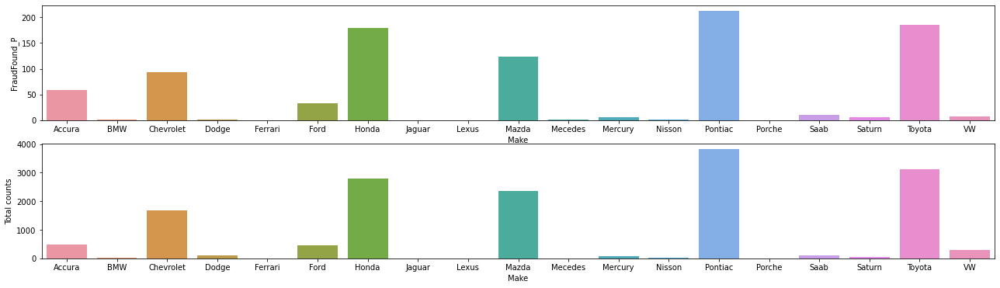

In [48]:
#plotting by FraudFound, looking to see if there are anything obvious that correlates to fraud
gpd_val1=df.groupby('Make').agg({'FraudFound_P':'sum'}).reset_index()
gpd_val2=df.groupby('Make').agg('count').reset_index()

fig, (ax1,ax2) = plt.subplots(2,1,figsize=(22, 6))
sns.barplot(x='Make', y='FraudFound_P', data = gpd_val1,ax=ax1)
sns.barplot(x='Make', y='FraudFound_P', data = gpd_val2,ax=ax2)

total_list = pd.concat([gpd_val1, gpd_val2['FraudFound_P'].rename('Total Accidents')],axis=1)
total_list['Percentage by Make']= round((total_list['FraudFound_P']/total_list['Total Accidents'])*100,3)
total_list['Percentage by Total'] = round((total_list['FraudFound_P']/sum(total_list['Total Accidents']))*100,3)

ax2.set(ylabel='Total counts')

data = [['Column total'],
        [sum(total_list['FraudFound_P'])], 
        [sum(total_list['Total Accidents'])], 
        [sum(total_list['Percentage by Make'])], 
        [sum(total_list['Percentage by Total'])]]

nr = pd.DataFrame(data)

nr1 = nr.transpose()
nr1.rename(columns={0:'Make',1:'FraudFound_P',2:'Total Accidents',3:'Percentage by Make',4:'Percentage by Total'}, inplace=True)
pd.concat([total_list,nr1],ignore_index=True)

# Correlation Matrices

C:\Users\ilias\AppData\Local\Temp\ipykernel_9084\1605924588.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

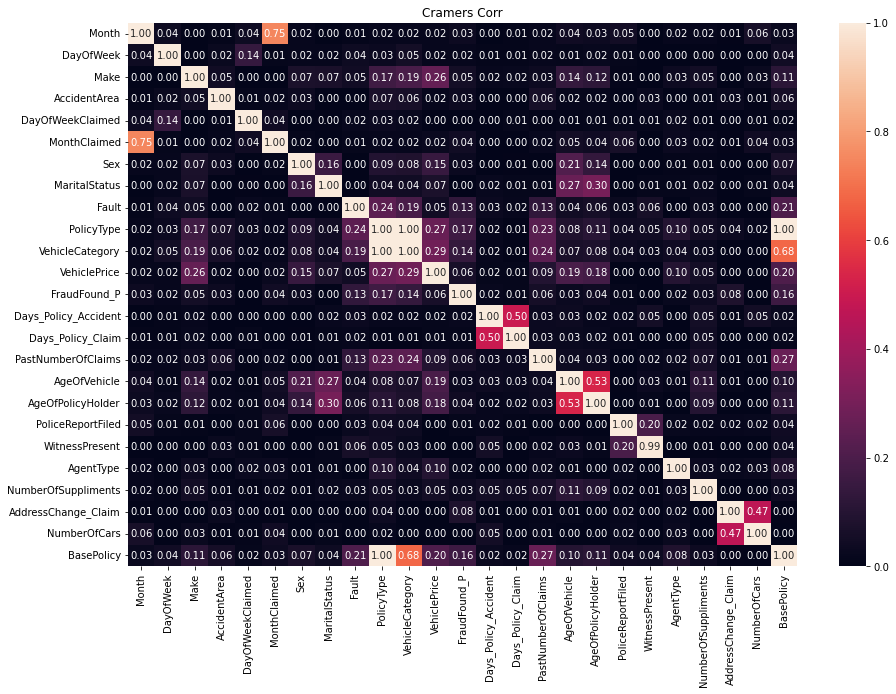

In [49]:
# Correlation Between Categorical & Target
ob=[]
for data in df.columns:
    if data == 'FraudFound_P':
        ob.append(data)
    if df[data].dtype=='object':
        ob.append(data)
        
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

cramers_df = pd.DataFrame(index=ob)

for x in ob:
    a = []
    for y in ob:
        a.append(cramers_v(df[y], df[x]))
    cramers_df[x] = a
    
    
    plt.figure(figsize=(15,10))
sns.heatmap(cramers_df, annot=True, fmt='.2f')
plt.title('Cramers Corr')
plt.show()

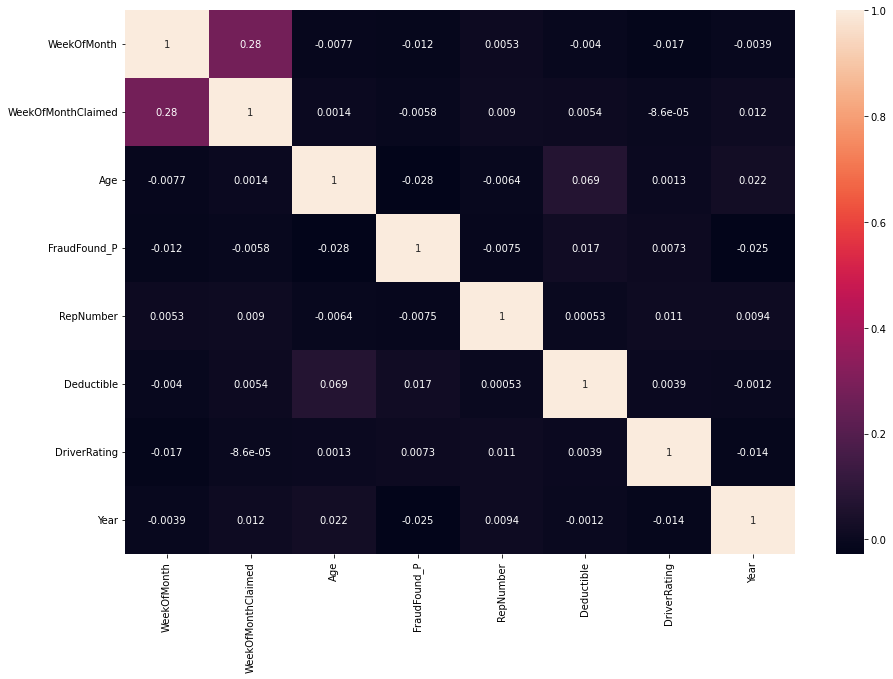

In [50]:
# Correlation Between Continuous & Target
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True)
plt.show()

# Preprocessing

In [51]:
# Drop Policy Type
df = df.drop(columns='PolicyType')

In [52]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


# Encode Categorical Data

In [53]:
df.select_dtypes(include=['object']).dtypes

Month                   object
DayOfWeek               object
Make                    object
AccidentArea            object
DayOfWeekClaimed        object
MonthClaimed            object
Sex                     object
MaritalStatus           object
Fault                   object
VehicleCategory         object
VehiclePrice            object
Days_Policy_Accident    object
Days_Policy_Claim       object
PastNumberOfClaims      object
AgeOfVehicle            object
AgeOfPolicyHolder       object
PoliceReportFiled       object
WitnessPresent          object
AgentType               object
NumberOfSuppliments     object
AddressChange_Claim     object
NumberOfCars            object
BasePolicy              object
dtype: object

In [54]:
#df['AccidentArea'] = df['AccidentArea'].replace({'Urban':1, 'Rural':0})
#df['Sex'] = df['Sex'].replace({'Female':1, 'Male':0})
#df['Fault'] = df['Fault'].replace({'Policy Holder':1, 'Third Party':0})
#df['PoliceReportFiled'] = df['PoliceReportFiled'].replace({'Yes':1, 'No':0})
#df['WitnessPresent'] = df['WitnessPresent'].replace({'Yes':1, 'No':0})
#df['AgentType'] = df['AgentType'].replace({'External':1, 'Internal':0})
#df['Month'] = df['Month'].replace({'Jan':1,'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12})
#df['DayOfWeek'] = df['DayOfWeek'].replace({'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7})
#df['MonthClaimed'] = df['MonthClaimed'].replace({'Jan':1,'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12})
#df['DayOfWeekClaimed'] = df['DayOfWeekClaimed'].replace({'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7})
#df['PastNumberOfClaims'] = df['PastNumberOfClaims'].replace({'none':0 ,'1':1,'2 to 4':2,'more than 4':3})
#df['NumberOfSuppliments'] = df['NumberOfSuppliments'].replace({'none':0,'1 to 2':1,'3 to 5':2,'more than 5':4})
#df['VehiclePrice'] = df['VehiclePrice'].replace({'less than 20000':0,'20000 to 29000':1,'30000 to 39000':2,
#                                                  '40000 to 59000':3,'60000 to 69000':4,'more than 69000':5})
#df['AgeOfVehicle'] = df['AgeOfVehicle'].replace({'3 years':3,'6 years':6,'7 years':7,'more than 7':8,'5 years':5,'new':0,'4 years':4,'2 years':2})

In [55]:
col_ordering = [
    {'col':'AccidentArea','mapping':{'Urban':1, 'Rural':0}},
    {'col':'Sex','mapping':{'Female':1, 'Male':0}},
    {'col':'Fault','mapping':{'Policy Holder':1, 'Third Party':0}},
    {'col':'PoliceReportFiled','mapping':{'Yes':1, 'No':0}},
    {'col':'WitnessPresent','mapping':{'Yes':1, 'No':0}},
    {'col':'AgentType','mapping':{'External':1, 'Internal':0}},
    {'col':'Month','mapping':{'Jan':1,'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12}},
    {'col':'DayOfWeek','mapping':{'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7}},
    {'col':'DayOfWeekClaimed','mapping':{'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7}},
    {'col':'MonthClaimed','mapping':{'Jan':1,'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12}},
    {'col':'PastNumberOfClaims','mapping':{'none':0 ,'1':1,'2 to 4':2,'more than 4':3 }},
    {'col':'NumberOfSuppliments','mapping':{'none':0,'1 to 2':1,'3 to 5':2,'more than 5':3}}, 
    {'col':'VehiclePrice','mapping':{'less than 20000':0,'20000 to 29000':1,'30000 to 39000':2,
                                     '40000 to 59000':3,'60000 to 69000':4,'more than 69000':5}},
    {'col':'AgeOfVehicle','mapping':{'3 years':3,'6 years':6,'7 years':7,'more than 7':8,'5 years':5,'new':0,'4 years':4,'2 years':2}},
    {'col':'Days_Policy_Accident','mapping':{'more than 30':4,'15 to 30':3,'none':0,'1 to 7':1,'8 to 15':2}},
    {'col':'Days_Policy_Claim','mapping':{'more than 30':4,'15 to 30':3,'none':0,'1 to 7':1,'8 to 15':2}},
    {'col':'AgeOfPolicyHolder','mapping':{'16 to 17':1,'18 to 20':2,'21 to 25':3,'26 to 30':4,'31 to 35':5,'36 to 40':6,
                                          '41 to 50':7,'51 to 65':8,'over 65':9}},
    {'col':'AddressChange_Claim','mapping':{'no change':0,'under 6 months':1,'1 year':2,'2 to 3 years':3,'4 to 8 years':4}},
    {'col':'NumberOfCars','mapping':{'1 vehicle':1,'2 vehicles':2,'3 to 4':3,'5 to 8':4,'more than 8':5}}
]
ord_encoder = OrdinalEncoder(mapping = col_ordering, return_df=True)

In [56]:
df2 = ord_encoder.fit_transform(df)

In [57]:
OHE = OneHotEncoder(cols = ['Make', 'MaritalStatus', 'VehicleCategory','BasePolicy'], use_cat_names=True, return_df=True)
df3 = OHE.fit_transform(df2)

In [58]:
df3.head()

,Month,WeekOfMonth,DayOfWeek,Make_Honda,Make_Toyota,Make_Ford,Make_Mazda,Make_Chevrolet,Make_Pontiac,Make_Accura,...,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy_Liability,BasePolicy_Collision,BasePolicy_All Perils
0,12,5,3,1,0,0,0,0,0,0,...,0,0,1,0,2,3,1994,1,0,0
1,1,3,3,1,0,0,0,0,0,0,...,1,0,1,0,0,1,1994,0,1,0
2,10,5,5,1,0,0,0,0,0,0,...,0,0,1,0,0,1,1994,0,1,0
3,6,2,6,0,1,0,0,0,0,0,...,1,0,1,3,0,1,1994,1,0,0
4,1,5,1,1,0,0,0,0,0,0,...,0,0,1,0,0,1,1994,0,1,0


In [59]:
cat_var_prod = list(product(df3.columns,df3.columns, repeat = 1 ))

## Creating an empty variable and picking only the p value from the output of Chi-Square test
result = []
for i in cat_var_prod:
    if i[0] != i[1]:
        result.append((i[0],i[1],list(ss.chi2_contingency(pd.crosstab(
                                    df3[i[0]], df3[i[1]])))[1]))
        chi_test_output = pd.DataFrame(result, columns = ['var1', 'var2', 'coeff'])

In [60]:
chi_test_output2 = chi_test_output[chi_test_output['var1']=='FraudFound_P'].sort_values('coeff').reset_index(drop=True)
def rej_acc(x):
    if x > 0.05:
        Ho = 'A_H0'
    else:
        Ho = 'R_H0'
    return Ho

chi_test_output2['result'] = chi_test_output2['coeff'].apply(rej_acc)
chi_test_output2

,var1,var2,coeff,result
0,FraudFound_P,BasePolicy_Liability,3.116620e-81,R_H0
1,FraudFound_P,VehicleCategory_Sport,1.208553e-63,R_H0
2,FraudFound_P,Fault,1.406180e-59,R_H0
3,FraudFound_P,VehicleCategory_Sedan,9.021607e-52,R_H0
4,FraudFound_P,BasePolicy_All Perils,8.400805e-44,R_H0
5,FraudFound_P,AddressChange_Claim,9.704718e-22,R_H0
6,FraudFound_P,Deductible,1.302831e-15,R_H0
7,FraudFound_P,VehiclePrice,2.888324e-13,R_H0
8,FraudFound_P,PastNumberOfClaims,1.405198e-11,R_H0
9,FraudFound_P,Make_Accura,2.516880e-09,R_H0


# Split Data

In [61]:
X = df3.drop(columns='FraudFound_P')
y = df3['FraudFound_P']

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=48, stratify=y)

In [63]:
y_train.value_counts()

0    11597
1      738
Name: FraudFound_P, dtype: int64

#

#

# Model Function

In [64]:
modelname, acc, recall, precision, f1, roc_auc = [],[],[],[],[],[]
model = {'xgboost':XGBClassifier(objective= 'binary:logistic',eval_metric='aucpr'), 
         'LightGBM':LGBMClassifier(is_unbalance=True),
         'dt': DecisionTreeClassifier(),
         'rf':RandomForestClassifier(),
         'blf':BalancedRandomForestClassifier(),
                   
        }

def fit_model(x_train, x_test, y_train, y_test, sampling):
    for key,value in zip(model, model.values()):
        print(f"Model {key} {sampling}")
        ml_model = value
        ml_model.fit(x_train, y_train)
        y_pred = ml_model.predict(x_test)
        
        modelname.append(f'{key} {sampling}')
        acc.append(accuracy_score(y_test, y_pred))
        f1.append(f1_score(y_test, y_pred))
        recall.append(recall_score(y_test, y_pred))
        precision.append(precision_score(y_test, y_pred))
        roc_auc.append(roc_auc_score(y_test, y_pred))

def sampling(x_train, y_train, kind='over', ss=0.5):
    if kind == 'over':
        oversample = SMOTE(sampling_strategy=ss)
        X, y = oversample.fit_resample(x_train, y_train)
    elif kind == 'under':
        join_train = pd.concat([x_train, y_train], axis=1)
        claim = join_train[join_train['FraudFound_P']==1]
        no_claim = join_train[join_train['FraudFound_P']==0]

        undersample_noclaim = no_claim.sample(len(claim)*3)
        join_train2 = pd.concat([claim,undersample_noclaim]).sample(frac=1)

        X = join_train2.drop(columns='FraudFound_P')
        y = join_train2['FraudFound_P']
    return X, y

def metric_result(y_test, y_pred):
    print("F1 Score : ",f1_score(y_test, y_pred, average='binary'))
    print("Recall Score : ",recall_score(y_test, y_pred))
    print("Precision Score : ",precision_score(y_test, y_pred))

    ig, ax = plt.subplots(1,2, figsize=(10,5))
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(ax=ax[0])
    ax[0].set_title('Confusion Matrix')

    # ROC AUC
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    ax[1].plot(fpr,tpr, label="AUC="+str(auc))
    ax[1].set_title('ROC AUC')
    ax[1].set_ylabel('True Positive Rate')
    ax[1].set_xlabel('False Positive Rate')
    ax[1].legend(loc=4)
    plt.show()

def glm_result(res, X_test, y_test):
    X_test_sm = sm.add_constant(X_test)
    y_pred = res.predict(X_test_sm)

    df_res = pd.DataFrame({'is_claim_real':y_test, 'is_claim_prob':y_pred})
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        df_res[i]= df_res.is_claim_prob.map(lambda x: 1 if x > i else 0)
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

    cut_off = [0.0,0.05, 0.1, 0.15 , 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
    f1_result = []
    for i in cut_off:
        df_res['final_predicted'] = df_res['is_claim_prob'].map( lambda x: 1 if x > i else 0)
        f1_result.append(roc_auc_score(df_res['is_claim_real'], df_res['final_predicted']))
    df_res2 = pd.DataFrame({'cut_off':cut_off, 'f1_score':f1_result})
    best_tresh = df_res2.sort_values('f1_score', ascending=False).head(1)['cut_off'].values[0]
    y_pred_thresh = (y_pred >= best_tresh).astype('float')
    print('Best Threshold :', best_tresh)
    metric_result(y_test, y_pred_thresh)

def find_best_tresh(pred_proba, y_test):
    df_res = pd.DataFrame({'prob':pred_proba})
    cut_off = [0.0,0.05, 0.1, 0.15 , 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
    f1_result = []
    for i in cut_off:
        df_res['final_predicted'] = df_res['prob'].map( lambda x: 1 if x > i else 0)
        f1_result.append(roc_auc_score(y_test, df_res['final_predicted']))
    df_res2 = pd.DataFrame({'cut_off':cut_off, 'f1_score':f1_result})
    best_tresh = df_res2.sort_values('f1_score', ascending=False).head(1)['cut_off'].values[0]
    y_pred_thresh = (y_pred >= best_tresh).astype('float')
    print('Best Threshold :', best_tresh)
    metric_result(y_test, y_pred_thresh)

# Oversampling

In [65]:
oversample = SMOTE(sampling_strategy=0.5)
X_over, y_over = oversample.fit_resample(X_train, y_train)
print('After Oversampling:\n',y_over.value_counts())

After Oversampling:
 0    11597
1     5798
Name: FraudFound_P, dtype: int64


In [66]:
fit_model(X_over, X_test, y_over, y_test, 'over')

Model xgboost over
Model LightGBM over
Model dt over
Model rf over
Model blf over


# Undersampling

In [67]:
join_train = pd.concat([X_train, y_train], axis=1)
claim = join_train[join_train['FraudFound_P']==1]
no_claim = join_train[join_train['FraudFound_P']==0]

undersample_noclaim = no_claim.sample(len(claim)*2)
join_train2 = pd.concat([claim,undersample_noclaim]).sample(frac=1)

print("Before Undersample:\n", join_train['FraudFound_P'].value_counts())
print("After Undersample:\n", join_train2['FraudFound_P'].value_counts())

X_under = join_train2.drop(columns='FraudFound_P')
y_under = join_train2['FraudFound_P']

Before Undersample:
 0    11597
1      738
Name: FraudFound_P, dtype: int64
After Undersample:
 0    1476
1     738
Name: FraudFound_P, dtype: int64


In [68]:
fit_model(X_under, X_test, y_under, y_test, 'Under')

Model xgboost Under
Model LightGBM Under
Model dt Under
Model rf Under
Model blf Under


# Without Over/Under Sampling

In [69]:
fit_model(X_train, X_test, y_train, y_test, 'Normal')

Model xgboost Normal
Model LightGBM Normal
Model dt Normal
Model rf Normal
Model blf Normal


In [70]:
df_model = pd.DataFrame({'model':modelname, 'accuracy':acc, 'recall':recall, 'precision':precision, 'f1':f1, 'roc_auc':roc_auc})

In [71]:
df_model

,model,accuracy,recall,precision,f1,roc_auc
0,xgboost over,0.932555,0.086486,0.290909,0.133333,0.536517
1,LightGBM over,0.925746,0.221622,0.325397,0.263666,0.596151
2,dt over,0.883593,0.254054,0.175373,0.207506,0.588910
3,rf over,0.936122,0.032432,0.250000,0.057416,0.513112
4,blf over,0.916342,0.124324,0.193277,0.151316,0.545605
5,xgboost Under,0.809014,0.643243,0.185358,0.287787,0.731418
6,LightGBM Under,0.739300,0.800000,0.161749,0.269091,0.767713
7,dt Under,0.758106,0.556757,0.134289,0.216387,0.663856
8,rf Under,0.823606,0.535135,0.177738,0.266846,0.688575
9,blf Under,0.657912,0.940541,0.142857,0.248040,0.790208


In [72]:
max_accuracy = df_model['accuracy'].max()
best_model = df_model.loc[df_model['accuracy'] == max_accuracy, 'model'].values[0]
best_model

'xgboost Normal'

In [73]:
max_recall = df_model['recall'].max()
best_model = df_model.loc[df_model['recall'] == max_recall, 'model'].values[0]
best_model

'blf Under'

In [74]:
max_precision = df_model['precision'].max()
best_model = df_model.loc[df_model['precision'] == max_precision, 'model'].values[0]
best_model

'xgboost Normal'

In [75]:
max_f1 = df_model['f1'].max()
best_model = df_model.loc[df_model['f1'] == max_f1, 'model'].values[0]
best_model

'xgboost Under'

In [76]:
max_roc_auc = df_model['roc_auc'].max()
best_model = df_model.loc[df_model['roc_auc'] == max_roc_auc, 'model'].values[0]
best_model

'blf Under'

 # HyperParameter Tuning Model 1 

In [77]:
X_over, y_over = sampling(X_train, y_train, 'over', 0.5)
X_under, y_under = sampling(X_train, y_train, 'under', 0.5)

#

#  1 XGBoost

In [78]:
params = {
            'n_estimators':[300], #300
          'max_depth':[7], #7
          'learning_rate':[0.1] #0.1
         }
skf = RepeatedStratifiedKFold(n_splits=3)
xgb = XGBClassifier(use_label_encoder=False, objective= 'binary:logistic',eval_metric='auc')

grid_search = GridSearchCV(estimator=xgb, param_grid=params, scoring='f1', cv=skf)
grid_search.fit(X_under, y_under)

C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.p

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='auc', feature_types=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     imp...
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, 

In [79]:
grid_search.best_score_

0.4892778263642023

<AxesSubplot:>

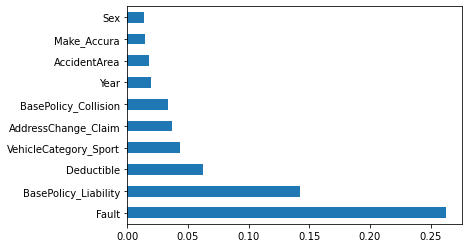

In [80]:
feat_importances = pd.Series(grid_search.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.2677685950413223
Recall Score :  0.43783783783783786
Precision Score :  0.19285714285714287


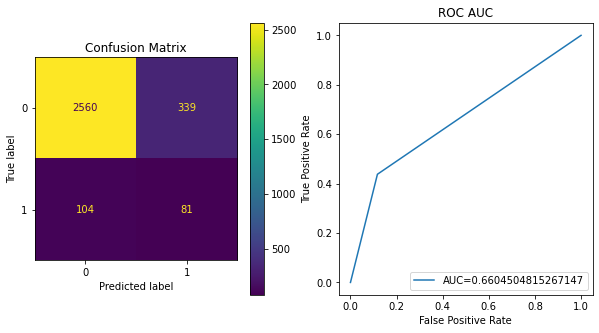

In [81]:
y_pred = grid_search.predict(X_test)
metric_result(y_test, y_pred)

# 2 LightGBM

In [82]:
params = {
          'boosting_type':['gbdt'],#300
          'n_estimators':[150],
          'num_leaves':[32], #7
          'learning_rate':[0.02] #0.1
         }
skf = RepeatedStratifiedKFold(n_splits=3)
lgbm = LGBMClassifier(objective= 'binary', class_weight='balanced')

grid_search_lgbm = GridSearchCV(estimator=lgbm, param_grid=params, scoring='f1', cv=skf)
grid_search_lgbm.fit(X_under, y_under)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=LGBMClassifier(class_weight='balanced',
                                      objective='binary'),
             param_grid={'boosting_type': ['gbdt'], 'learning_rate': [0.02],
                         'n_estimators': [150], 'num_leaves': [32]},
             scoring='f1')

In [83]:
grid_search_lgbm.best_score_

0.590282502257791

In [84]:
grid_search_lgbm.best_params_

{'boosting_type': 'gbdt',
 'learning_rate': 0.02,
 'n_estimators': 150,
 'num_leaves': 32}

<AxesSubplot:>

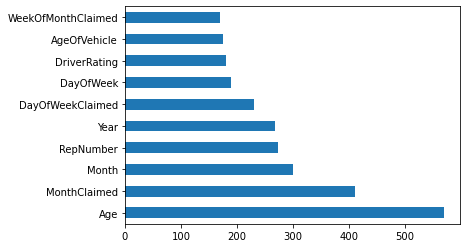

In [85]:
feat_importances = pd.Series(grid_search_lgbm.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.25078369905956116
Recall Score :  0.8648648648648649
Precision Score :  0.1466544454628781


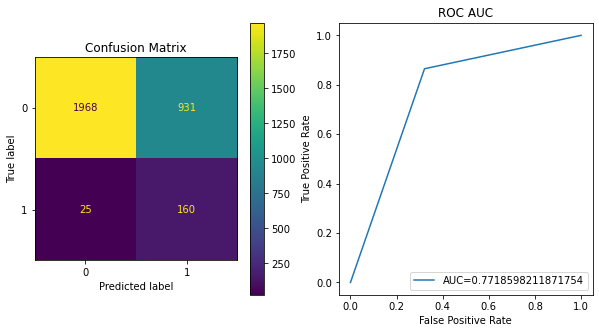

In [86]:
y_pred = grid_search_lgbm.predict(X_test)
metric_result(y_test, y_pred)

#  3 Decision Tree Classifier

In [87]:
params = {
          'criterion':['gini', 'entropy', 'log_loss'],#300
          'splitter':['best','random'],
          'min_samples_split':[2,3,4,5],
          'max_features':['','auto', 'sqrt', 'log2']
         }
skf = RepeatedStratifiedKFold(n_splits=3)
dt = DecisionTreeClassifier(class_weight='balanced')

grid_search_dt = GridSearchCV(estimator=dt, param_grid=params, scoring='f1', cv=skf)
grid_search_dt.fit(X_under, y_under)

C:\Users\ilias\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
1440 fits failed out of a total of 2880.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
720 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\ilias\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ilias\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "C:\Users\ilias\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 281, in fit
    raise ValueError(
ValueError: Invalid value for max_features. Allowed string values are 'auto'

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=DecisionTreeClassifier(class_weight='balanced'),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['', 'auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 3, 4, 5],
                         'splitter': ['best', 'random']},
             scoring='f1')

In [88]:
grid_search_dt.best_params_

{'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_split': 5,
 'splitter': 'random'}

In [89]:
grid_search_dt.best_score_

0.47252904354062897

<AxesSubplot:>

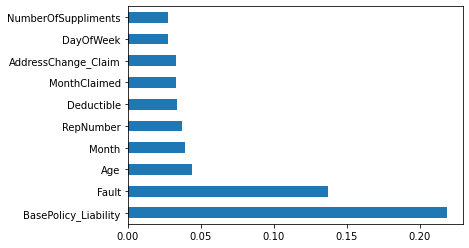

In [90]:
feat_importances = pd.Series(grid_search_dt.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.21756487025948104
Recall Score :  0.5891891891891892
Precision Score :  0.13341493268053856


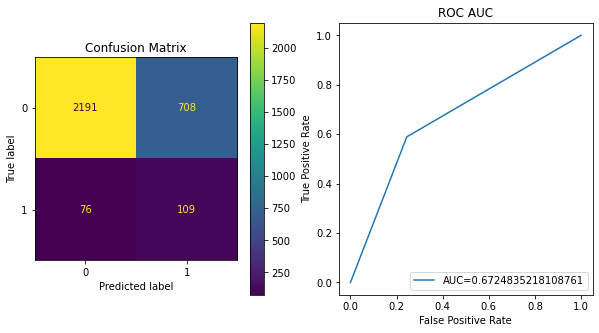

In [91]:
y_pred = grid_search_dt.predict(X_test)
metric_result(y_test, y_pred)

# 4. Random Forest

In [92]:
params = {
          'n_estimators':[200],
          'criterion':['gini'],
          'min_samples_split':[3],
          'min_samples_leaf':[3],
         }
skf = RepeatedStratifiedKFold(n_splits=3)
rf = RandomForestClassifier(class_weight='balanced')

grid_search_rf = GridSearchCV(estimator=rf, param_grid=params, scoring='f1', cv=skf)
grid_search_rf.fit(X_under, y_under)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=RandomForestClassifier(class_weight='balanced'),
             param_grid={'criterion': ['gini'], 'min_samples_leaf': [3],
                         'min_samples_split': [3], 'n_estimators': [200]},
             scoring='f1')

In [93]:
grid_search_rf.best_params_

{'criterion': 'gini',
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'n_estimators': 200}

In [94]:
grid_search_rf.best_score_

0.5413044031148238

<AxesSubplot:>

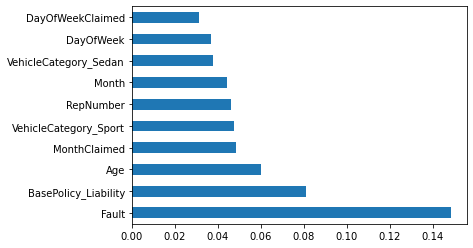

In [95]:
feat_importances = pd.Series(grid_search_rf.best_estimator_.feature_importances_, index=X_train.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.2617046818727491
Recall Score :  0.5891891891891892
Precision Score :  0.16820987654320987


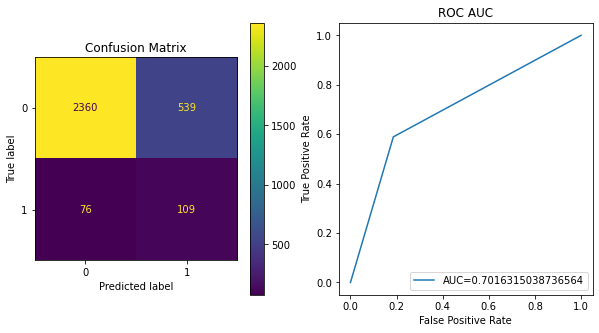

In [96]:
y_pred = grid_search_rf.predict(X_test)
metric_result(y_test, y_pred)

# Hypertuning Model With Feature Selection From Chi2 test.

In [97]:
#X_train2 = X_train.drop(columns=['PoliceReportFiled', 'Days_Policy_Claim', 'DayOfWeek', 'WitnessPresent', 'WitnessPresent', 'WeekOfMonthClaimed', 'DayOfWeekClaimed', 'DriverRating', 'WeekOfMonth', 'NumberOfCars', 'RepNumber'])
#X_test2 = X_test.drop(columns=['PoliceReportFiled', 'Days_Policy_Claim', 'DayOfWeek', 'WitnessPresent', 'WitnessPresent', 'WeekOfMonthClaimed', 'DayOfWeekClaimed', 'DriverRating', 'WeekOfMonth', 'NumberOfCars', 'RepNumber'])

In [98]:
X_train2 = X_train.drop(columns=['Days_Policy_Claim','DayOfWeek','WitnessPresent','WeekOfMonthClaimed','DayOfWeekClaimed','DriverRating','WeekOfMonth','NumberOfCars','RepNumber','Make_Accura','Make_Ferrari','Make_Lexus','Make_Porche','Make_Jaguar','Make_BMW','Make_Toyota','Make_Nisson','Make_Mercury','Make_Mecedes','Make_Chevrolet','Make_Honda','Make_Ford','Make_Saturn','Make_Pontiac','Make_Dodge','Make_Saab','Make_Mazda','Make_VW'])
X_test2 = X_test.drop(columns=['Days_Policy_Claim','DayOfWeek','WitnessPresent','WeekOfMonthClaimed','DayOfWeekClaimed','DriverRating','WeekOfMonth','NumberOfCars','RepNumber','Make_Accura','Make_Ferrari','Make_Lexus','Make_Porche','Make_Jaguar','Make_BMW','Make_Toyota','Make_Nisson','Make_Mercury','Make_Mecedes','Make_Chevrolet','Make_Honda','Make_Ford','Make_Saturn','Make_Pontiac','Make_Dodge','Make_Saab','Make_Mazda','Make_VW'])

In [99]:
# X_over, y_over = sampling(X_train, y_train, 'over', 0.5)
X_under2, y_under2 = sampling(X_train2, y_train, 'under')

# 1. XGBoost

In [100]:
params = {
            'n_estimators':[300], #300
          'max_depth':[8], #8
          'learning_rate':[0.1] #0.1
         }
skf = RepeatedStratifiedKFold(n_splits=3)
xgb = XGBClassifier(use_label_encoder=False, objective= 'binary:logistic',eval_metric='auc')

grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=params, scoring='f1', cv=skf)
grid_search_xgb.fit(X_under2, y_under2)

C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
C:\Users\ilias\anaconda3\lib\site-packages\xgboost\sklearn.p

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='auc', feature_types=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     imp...
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, 

In [101]:
grid_search_xgb.best_params_

{'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 300}

In [102]:
grid_search_xgb.best_score_

0.533054377366538

<AxesSubplot:>

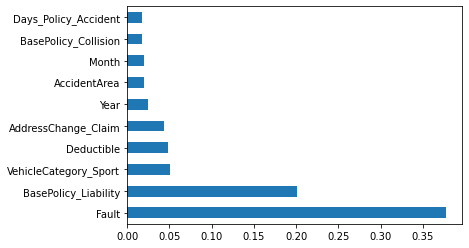

In [103]:
feat_importances = pd.Series(grid_search_xgb.best_estimator_.feature_importances_, index=X_train2.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.3131170662905501
Recall Score :  0.6
Precision Score :  0.21183206106870228


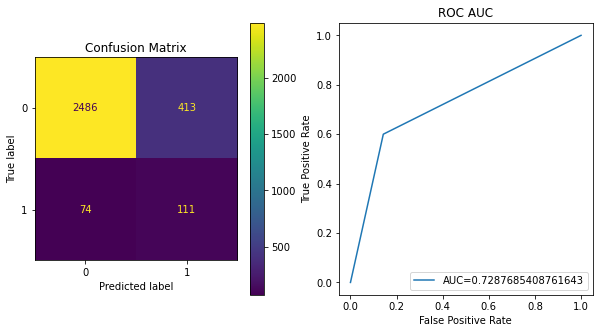

In [104]:
y_pred = grid_search_xgb.predict(X_test2)
metric_result(y_test, y_pred)

# 2. LightGBM

In [105]:
params = {
          'boosting_type':['gbdt'],
          'n_estimators':[300], #300
          'num_leaves':[32], #32
          'learning_rate':[0.01] #0.01
         }
skf = RepeatedStratifiedKFold(n_splits=3)
lgbm = LGBMClassifier(objective= 'binary', class_weight='balanced')

grid_search_lgbm = GridSearchCV(estimator=lgbm, param_grid=params, scoring='f1', cv=skf)
grid_search_lgbm.fit(X_under2, y_under2)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=LGBMClassifier(class_weight='balanced',
                                      objective='binary'),
             param_grid={'boosting_type': ['gbdt'], 'learning_rate': [0.01],
                         'n_estimators': [300], 'num_leaves': [32]},
             scoring='f1')

In [106]:
grid_search_lgbm.best_params_

{'boosting_type': 'gbdt',
 'learning_rate': 0.01,
 'n_estimators': 300,
 'num_leaves': 32}

In [107]:
grid_search_lgbm.best_score_

0.6295226415698818

<AxesSubplot:>

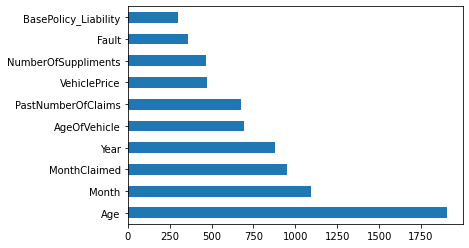

In [108]:
feat_importances = pd.Series(grid_search_lgbm.best_estimator_.feature_importances_, index=X_train2.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.25055596738324687
Recall Score :  0.9135135135135135
Precision Score :  0.14518900343642613


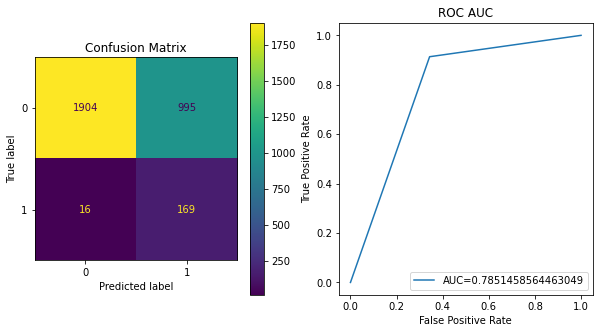

In [109]:
y_pred = grid_search_lgbm.predict(X_test2)
metric_result(y_test, y_pred)

# 3. Decision Tree

In [110]:
params = {
          'criterion':['entropy'],#entropy
          'splitter':['best'],
          'min_samples_split':[4], #4
          'max_features':['auto'] #auto
         }
skf = RepeatedStratifiedKFold(n_splits=3)
dt = DecisionTreeClassifier(class_weight='balanced')

grid_search_dt = GridSearchCV(estimator=dt, param_grid=params, scoring='f1', cv=skf)
grid_search_dt.fit(X_under2, y_under2)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=DecisionTreeClassifier(class_weight='balanced'),
             param_grid={'criterion': ['entropy'], 'max_features': ['auto'],
                         'min_samples_split': [4], 'splitter': ['best']},
             scoring='f1')

In [111]:
grid_search_dt.best_params_

{'criterion': 'entropy',
 'max_features': 'auto',
 'min_samples_split': 4,
 'splitter': 'best'}

In [112]:
grid_search_dt.best_score_

0.4958537092073683

<AxesSubplot:>

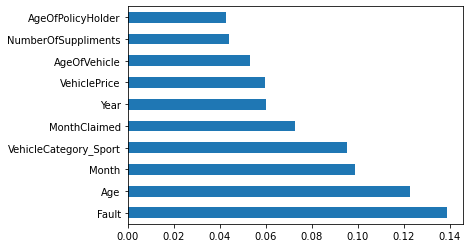

In [113]:
feat_importances = pd.Series(grid_search_dt.best_estimator_.feature_importances_, index=X_train2.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.25427350427350426
Recall Score :  0.6432432432432432
Precision Score :  0.1584553928095872


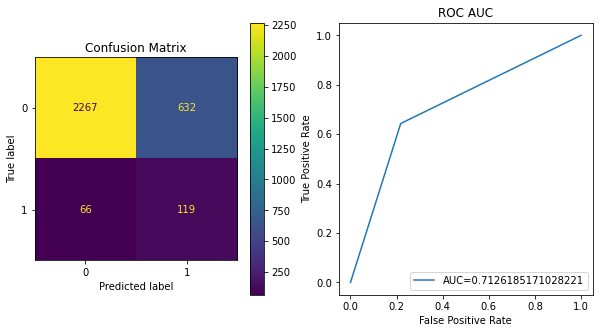

In [114]:
y_pred = grid_search_dt.predict(X_test2)
metric_result(y_test, y_pred)

# 4. Random Forest

In [115]:
params = {
          'n_estimators':[300], #300
          'criterion':['entropy'], #entropy
          'min_samples_split':[2], # 2
          'min_samples_leaf':[4], #4
         }
skf = RepeatedStratifiedKFold(n_splits=3)
rf = RandomForestClassifier(class_weight='balanced')

grid_search_rf = GridSearchCV(estimator=rf, param_grid=params, scoring='f1', cv=skf)
grid_search_rf.fit(X_under2, y_under2)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=3, random_state=None),
             estimator=RandomForestClassifier(class_weight='balanced'),
             param_grid={'criterion': ['entropy'], 'min_samples_leaf': [4],
                         'min_samples_split': [2], 'n_estimators': [300]},
             scoring='f1')

In [116]:
grid_search_rf.best_score_

0.6071092557320978

In [117]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 300}

<AxesSubplot:>

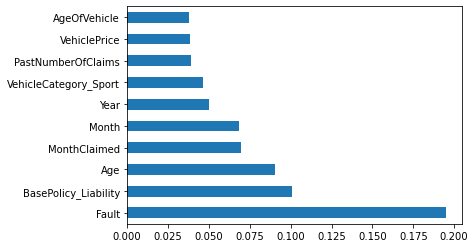

In [118]:
feat_importances = pd.Series(grid_search_rf.best_estimator_.feature_importances_, index=X_train2.columns)
feat_importances.sort_values(ascending=False).head(10).plot(kind='barh')

F1 Score :  0.2604340567612688
Recall Score :  0.8432432432432433
Precision Score :  0.1539980256663376


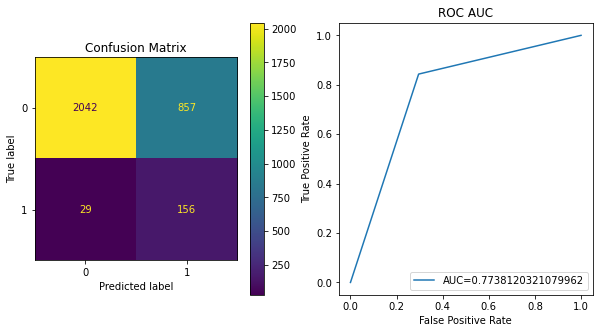

In [119]:
y_pred = grid_search_rf.predict(X_test2)
metric_result(y_test, y_pred)

# SHAP XGBoost

In [120]:
import shap

 99%|===================| 2908/2952 [01:07<00:01]        

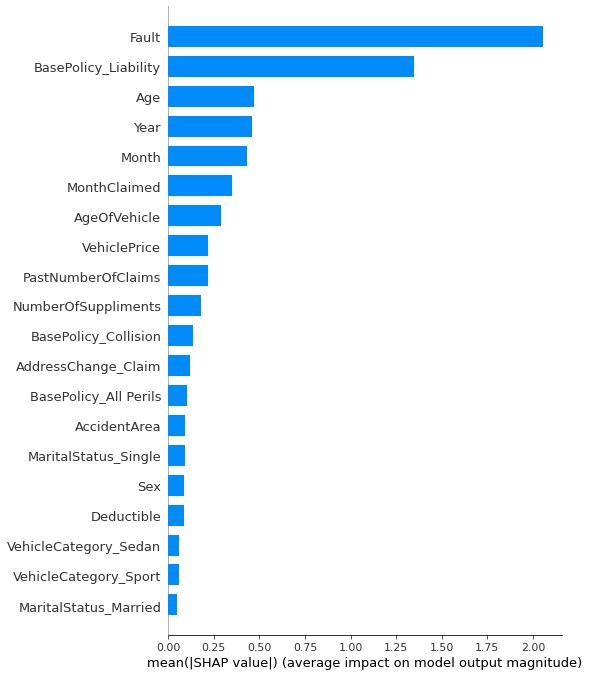

In [121]:
explainer = shap.TreeExplainer(grid_search_xgb.best_estimator_, X_under2)
shap_values = explainer.shap_values(X_under2)
shap.initjs()
shap.summary_plot(shap_values, X_under2, plot_type = "bar")

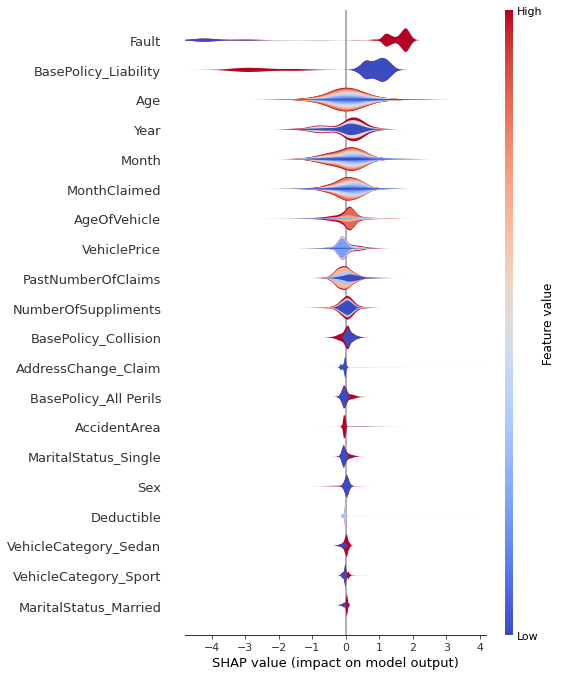

In [147]:
fig2=shap.summary_plot(shap_values, X_under2, plot_type="layered_violin", show = False)
plt.savefig('shap_standard_plot.png', bbox_inches='tight', dpi=300)

In [124]:
shap.force_plot(explainer.expected_value, shap_values[2, :], X_under2.iloc[2, :])

In [125]:
shap.force_plot(explainer.expected_value, shap_values[8, :], X_under2.iloc[8, :])

In [126]:
shap.force_plot(explainer.expected_value, shap_values[15, :], X_under2.iloc[15, :])

In [127]:
shap.force_plot(explainer.expected_value, shap_values[0, :], X_under2.iloc[0, :])

In [128]:
shap.force_plot(explainer.expected_value, shap_values[1, :], X_under2.iloc[1, :])

In [129]:
shap.force_plot(explainer.expected_value, shap_values[6, :], X_under2.iloc[6, :])

# Saving Plots.

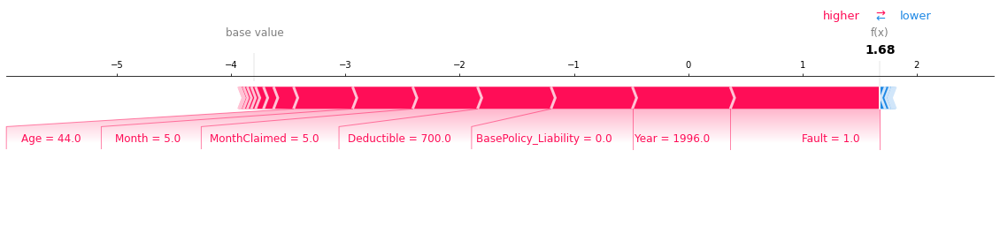

In [130]:
# Using 'show = False' and 'matplotlib = True' overwrites java and uses matplotlib to save the figures as png
#shap.force_plot(explainer.expected_value, shap_values[15, :], X_under2.iloc[15, :] , show = False, matplotlib = True)
#plt.savefig('Fraud3.png',format = "png",dpi = 150,bbox_inches = 'tight')

In [131]:
y_under2.head(20)

15120    1
561      0
5173     0
11412    1
6919     0
13289    0
2074     0
8699     0
7359     1
1999     0
12160    1
7275     0
14185    0
11116    0
10792    0
12152    1
12688    0
9229     0
2484     1
7139     0
Name: FraudFound_P, dtype: int64

In [132]:
X_under2.head(11)

,Month,AccidentArea,MonthClaimed,Sex,MaritalStatus_Single,MaritalStatus_Married,MaritalStatus_Widow,MaritalStatus_Divorced,Age,Fault,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,AgentType,NumberOfSuppliments,AddressChange_Claim,Year,BasePolicy_Liability,BasePolicy_Collision,BasePolicy_All Perils
15120,10,1,10,0,0,1,0,0,50.0,1,...,7,7,0,1,1,4,1996,0,0,1
561,4,1,5,0,1,0,0,0,28.0,1,...,6,5,0,1,1,3,1994,0,1,0
5173,1,1,1,0,0,1,0,0,51.0,0,...,8,7,0,1,0,0,1994,0,1,0
11412,4,0,4,0,0,1,0,0,44.0,1,...,7,6,0,1,0,0,1996,0,1,0
6919,1,1,1,0,0,1,0,0,26.0,1,...,6,5,0,1,0,0,1995,0,1,0
13289,9,1,10,0,0,1,0,0,41.0,0,...,7,6,0,1,0,0,1996,1,0,0
2074,6,1,6,0,1,0,0,0,35.0,1,...,6,5,0,1,0,0,1994,1,0,0
8699,12,0,1,0,1,0,0,0,16.5,1,...,0,1,0,1,0,0,1995,0,1,0
7359,10,1,10,0,1,0,0,0,28.0,1,...,5,5,0,1,0,0,1995,0,0,1
1999,1,1,2,0,1,0,0,0,43.0,1,...,7,6,0,1,0,0,1994,0,1,0


# LIME XGBoost

In [133]:
import lime
from lime import lime_tabular

In [134]:
np.random.seed(123)
predict_fn = lambda x: grid_search_xgb.predict_proba(x)

In [135]:
explainer2 = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_under2),
    feature_names = X_under2.columns,
    class_names=['Not Fraud', 'Fraud'],
    mode = 'classification'
)

In [136]:
data_row = X_under2.iloc[2] # iloc[0] is the first fraud detected by the model.

In [145]:
y_under2.head(30)

15120    1
561      0
5173     0
11412    1
6919     0
13289    0
2074     0
8699     0
7359     1
1999     0
12160    1
7275     0
14185    0
11116    0
10792    0
12152    1
12688    0
9229     0
2484     1
7139     0
7461     1
6532     0
5462     0
10826    0
10517    0
11579    0
1972     0
11451    0
14685    1
8986     0
Name: FraudFound_P, dtype: int64

In [144]:
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=20
)
# Generate the explanation figure
exp.show_in_notebook(show_table=True)




In [146]:
data_row = X_under2.iloc[28] # iloc[0] is the first fraud detected by the model.
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=10
)
exp.show_in_notebook(show_table=True)
exp.save_to_file('LIMEfraud2.html')

In [140]:
data_row = X_under2.iloc[15] # iloc[0] is the first fraud detected by the model.
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=10
)
exp.show_in_notebook(show_table=True)
exp.save_to_file('LIMEfraud3.html')

In [141]:
data_row = X_under2.iloc[0] # iloc[0] is the first fraud detected by the model.
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=10
)
exp.show_in_notebook(show_table=True)
exp.save_to_file('LIME_Nfraud1.html')

In [142]:
data_row = X_under2.iloc[1] # iloc[0] is the first fraud detected by the model.
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=10
)
exp.show_in_notebook(show_table=True)
exp.save_to_file('LIME_Nfraud2.html')

In [143]:
data_row = X_under2.iloc[6] # iloc[0] is the first fraud detected by the model.
exp = explainer2.explain_instance(
    data_row=data_row.values, 
    predict_fn=predict_fn,
    num_features=10
)
exp.show_in_notebook(show_table=True)
exp.save_to_file('LIME_Nfraud3.html')